In [1]:
import os
import sys
import numpy as np
import pandas as pd
pd.set_option('display.max_columns', 50)

from matplotlib import pyplot as plt
import seaborn as sns
%matplotlib inline

import plotly
import plotly.graph_objs as go
import cufflinks as cf
cf.set_config_file(offline=True)

In [2]:
base_path = os.path.abspath('../..')
data_path = os.path.join(base_path, 'data')
database_path = os.path.join(data_path, 'database')
strategy_path = os.path.join(base_path, 'strategy')
check_path = os.path.join(strategy_path, 'check')
sys.path.append(strategy_path)

In [3]:
from strategy import CommodityStrategy, EquityStrategy, IRStrategy, EmergingStrategy
from tester import Tester

In [4]:
from CPM import CPM
from CVA import CVA
from CVA2 import CVA2
from CSS import CSS
from CVO import CVO
from CCA3 import CCA3
from CVA3 import CVA3

# 1. CPM

In [5]:
cpm = CPM(strategy_name="CPM", asset_type="COMMODITY")
cpm.load_index_and_return(from_db=True, save_file=True)
cpm.set_rebalance_period(ts_freq='week', cs_freq='week', rebalance_weekday=1)  # rebalance_day: monday = 0, sunday = 6 
cpm.calculate_signal(CS=0.35, minobs=52, longlen=52, shortlen=17)
cpm.set_portfolio_parameter(cs_strategy_type='vol')
cpm.make_portfolio()

2020-01-02 10:26:28,133 - CPM - INFO - [STEP 0] START LOGGING CPM
2020-01-02 10:26:28,135 - CPM - INFO - [STEP 1] LOAD DATA
2020-01-02 10:26:28,136 - CPM - INFO - [STEP 1 - 1] CONNECT TO BLOOM DATABASE
2020-01-02 10:26:28,146 - CPM - INFO - [STEP 1 - 2] GET DATA FROM BLOOM DATABASE
2020-01-02 10:26:37,975 - CPM - INFO - [STEP 1 - 3] CHANGE BLOOM DATA INTO STANDARD FORMAT
2020-01-02 10:26:38,033 - CPM - INFO - [STEP 1 - 4] SAVE RETURN DATA INTO CSV FORMAT
2020-01-02 10:26:38,050 - CPM - INFO - [STEP 1 - 5] SAVE RETURN DATA INTO CSV FORMAT
2020-01-02 10:26:38,339 - CPM - INFO - [STEP 2] SET REBALANCE PERIOD
2020-01-02 10:26:38,340 - CPM - INFO - [STEP 3] CACULATE SIGNAL
2020-01-02 10:26:38,340 - CPM - INFO - [STEP 2 - 1] CACULATE SIGNAL FOR WEATHER GROUP
2020-01-02 10:26:39,337 - CPM - INFO - [STEP 2 - 2] CACULATE SIGNAL FOR NOT WEATHER GROUP
C:\Users\jungyoon.choi\Desktop\jungyoon\project\risk_premia\python\strategy\CPM.py:186: FutureWarning:


Passing list-likes to .loc or [] with any 

In [6]:
start_date = '2001-01-01'
end_date = '2018-05-09'

# get r results
cpm_comp_df = pd.read_csv('./past/cpm.csv', header=0, index_col=0, parse_dates=True)
cpm_lag_comp_df = pd.read_csv('./past/cpm_lag.csv', header=0, index_col=0, parse_dates=True)

In [7]:
tester = Tester(cpm)
tester.set_period(start=start_date, end=end_date)
tester.run(save_file=False)

2020-01-02 10:28:17,478 - CPM - INFO - [STEP 6] START BACKTEST
2020-01-02 10:28:17,479 - CPM - INFO - [STEP 6 - 1] BACKTEST CPM TIME SERIES
2020-01-02 10:28:19,909 - CPM - INFO - [STEP 6 - 2] BACKTEST CPM CROSS SECTIONAL


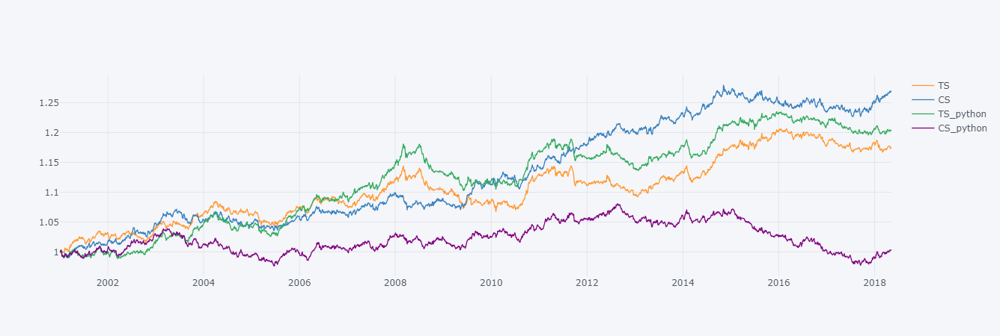

In [8]:
to_plot = (1.+ cpm_lag_comp_df).loc[start_date:].cumprod()
to_plot['TS_python'] = tester.strategy.TS_result
to_plot['CS_python'] = tester.strategy.CS_result
to_plot.iplot()

# 2. CVA

In [9]:
cva = CVA(strategy_name="CVA", asset_type="COMMODITY")
cva.load_index_and_return(from_db=False, save_file=False)
cva.set_rebalance_period(ts_freq='week', cs_freq='week', rebalance_weekday=1)  # rebalance_day: monday = 0, sunday = 6
cva.calculate_signal(CS=0.35, nopos=0.6, lookback_period=63)
cva.set_portfolio_parameter(cs_strategy_type='vol', min_vol=0.15)
cva.make_portfolio()

2020-01-02 10:28:23,959 - CVA - INFO - [STEP 0] START LOGGING CVA
2020-01-02 10:28:23,960 - CVA - INFO - [STEP 1] LOAD DATA
2020-01-02 10:28:23,961 - CVA - INFO - [STEP 1 - 1] LOAD DATA FROM FILE
2020-01-02 10:28:23,996 - CVA - INFO - [STEP 2] SET REBALANCE PERIOD
2020-01-02 10:28:23,997 - CVA - INFO - [STEP 3] CACULATE SIGNAL
2020-01-02 10:28:23,998 - CVA - INFO - [STEP 2 - 1] CACULATE SIGNAL FOR WEATHER GROUP
2020-01-02 10:28:26,412 - CVA - INFO - [STEP 2 - 2] CACULATE SIGNAL FOR NOT WEATHER GROUP
C:\Users\jungyoon.choi\Desktop\jungyoon\project\risk_premia\python\strategy\CVA.py:94: FutureWarning:


Passing list-likes to .loc or [] with any missing label will raise
KeyError in the future, you can use .reindex() as an alternative.

See the documentation here:
https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#deprecate-loc-reindex-listlike

C:\Users\jungyoon.choi\Desktop\jungyoon\project\risk_premia\python\strategy\CVA.py:95: FutureWarning:


Passing list-likes to .

In [10]:
start_date = '2001-01-01'
end_date = '2018-05-09'

# get r results
cva_comp_df = pd.read_csv('./past/cva.csv', header=0, index_col=0, parse_dates=True)
cva_lag_comp_df = pd.read_csv('./past/cva_lag.csv', header=0, index_col=0, parse_dates=True)

In [11]:
tester = Tester(cva)
tester.set_period(start=start_date, end=end_date)
tester.run(save_file=False)

2020-01-02 10:29:59,324 - CVA - INFO - [STEP 6] START BACKTEST
2020-01-02 10:29:59,325 - CVA - INFO - [STEP 6 - 1] BACKTEST CVA TIME SERIES
2020-01-02 10:30:00,270 - CVA - INFO - [STEP 6 - 2] BACKTEST CVA CROSS SECTIONAL


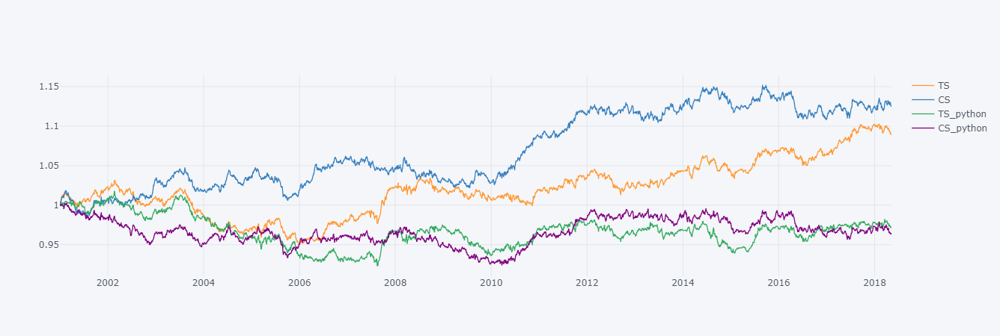

In [12]:
to_plot = (1.+ cva_lag_comp_df).loc[start_date:].cumprod()
to_plot['TS_python'] = tester.strategy.TS_result
to_plot['CS_python'] = tester.strategy.CS_result
to_plot.iplot()

# 3. CVO

In [13]:
cvo = CVO(strategy_name="CVO", asset_type="COMMODITY")
cvo.load_index_and_return(from_db=False, save_file=False)
cvo.set_rebalance_period(ts_freq='week', cs_freq='week', rebalance_weekday=1)  # rebalance_day: monday = 0, sunday = 6
cvo.calculate_signal(CS=0.35, nopos=0.4, minobs=52)
cvo.set_portfolio_parameter(cs_strategy_type='vol')
cvo.make_portfolio()

2020-01-02 10:30:03,399 - CVO - INFO - [STEP 0] START LOGGING CVO
2020-01-02 10:30:03,400 - CVO - INFO - [STEP 1] LOAD DATA
2020-01-02 10:30:03,401 - CVO - INFO - [STEP 1 - 1] LOAD DATA FROM FILE
2020-01-02 10:30:03,434 - CVO - INFO - [STEP 2] SET REBALANCE PERIOD
2020-01-02 10:30:03,434 - CVO - INFO - [STEP 3] CACULATE SIGNAL
2020-01-02 10:30:03,435 - CVO - INFO - [STEP 2 - 1] CACULATE SIGNAL FOR WEATHER GROUP
2020-01-02 10:30:06,048 - CVO - INFO - [STEP 2 - 2] CACULATE SIGNAL FOR NOT WEATHER GROUP
C:\Users\jungyoon.choi\Desktop\jungyoon\project\risk_premia\python\strategy\CVO.py:94: FutureWarning:


Passing list-likes to .loc or [] with any missing label will raise
KeyError in the future, you can use .reindex() as an alternative.

See the documentation here:
https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#deprecate-loc-reindex-listlike

C:\Users\jungyoon.choi\Desktop\jungyoon\project\risk_premia\python\strategy\CVO.py:95: FutureWarning:


Passing list-likes to .

In [14]:
start_date = '2001-01-01'
end_date = '2018-05-09'

# get r results
cvo_comp_df = pd.read_csv('./past/cvo.csv', header=0, index_col=0, parse_dates=True)
cvo_lag_comp_df = pd.read_csv('./past/cvo_lag.csv', header=0, index_col=0, parse_dates=True)

In [15]:
tester = Tester(cvo)
tester.set_period(start=start_date, end=end_date)
tester.run(save_file=False)

2020-01-02 10:31:34,173 - CVO - INFO - [STEP 6] START BACKTEST
2020-01-02 10:31:34,173 - CVO - INFO - [STEP 6 - 1] BACKTEST CVO TIME SERIES
2020-01-02 10:31:35,490 - CVO - INFO - [STEP 6 - 2] BACKTEST CVO CROSS SECTIONAL


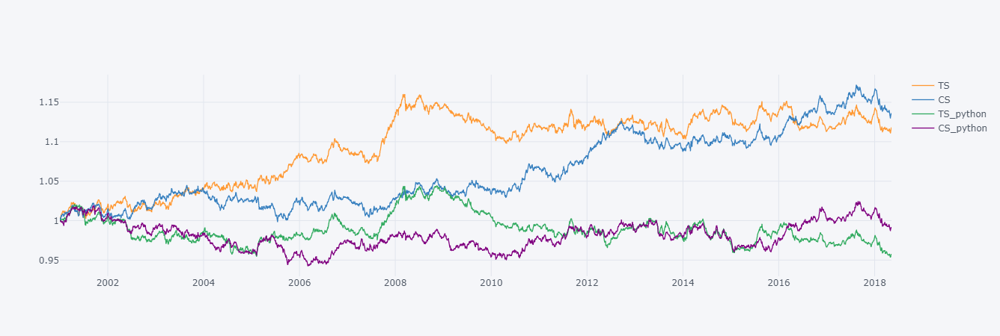

In [16]:
to_plot = (1.+ cvo_lag_comp_df).loc[start_date:].cumprod()
to_plot['TS_python'] = tester.strategy.TS_result
to_plot['CS_python'] = tester.strategy.CS_result
to_plot.iplot()

# 4. CCA3

In [17]:
cca3 = CCA3(strategy_name="CCA3", asset_type="COMMODITY")
cca3.load_index_and_return(from_db=False, save_file=False)
cca3.load_strategy_data(origin1='carry-com', origin2='carry-com2')
cca3.set_rebalance_period(ts_freq='month', cs_freq='month', rebalance_weekday=1)
cca3.calculate_signal(CS=0.35, nopos=0.4, minobs=60)
cca3.set_portfolio_parameter(cs_strategy_type='vol', min_vol=0.15)
cca3.make_portfolio()

2020-01-02 10:31:38,443 - CCA3 - INFO - [STEP 0] START LOGGING CCA3
2020-01-02 10:31:38,445 - CCA3 - INFO - [STEP 1] LOAD DATA
2020-01-02 10:31:38,445 - CCA3 - INFO - [STEP 1 - 1] LOAD DATA FROM FILE
2020-01-02 10:31:59,240 - CCA3 - INFO - [STEP 2] SET REBALANCE PERIOD
2020-01-02 10:31:59,241 - CCA3 - INFO - [STEP 3] CACULATE SIGNAL
C:\Users\jungyoon.choi\Desktop\jungyoon\project\risk_premia\python\strategy\CCA3.py:45: FutureWarning:

Currently, 'apply' passes the values as ndarrays to the applied function. In the future, this will change to passing it as Series objects. You need to specify 'raw=True' to keep the current behaviour, and you can pass 'raw=False' to silence this warning

C:\Users\jungyoon.choi\Desktop\jungyoon\project\risk_premia\python\strategy\CCA3.py:103: FutureWarning:


Passing list-likes to .loc or [] with any missing label will raise
KeyError in the future, you can use .reindex() as an alternative.

See the documentation here:
https://pandas.pydata.org/pandas-docs/

In [18]:
start_date = '2001-01-01'
end_date = '2018-05-09'

# get r results
cca3_comp_df = pd.read_csv('./past/cca3.csv', header=0, index_col=0, parse_dates=True)
cca3_lag_comp_df = pd.read_csv('./past/cca3_lag.csv', header=0, index_col=0, parse_dates=True)

In [19]:
tester = Tester(cca3)
tester.set_period(start=start_date, end=end_date)
tester.run(save_file=False)

2020-01-02 10:33:35,011 - CCA3 - INFO - [STEP 6] START BACKTEST
2020-01-02 10:33:35,011 - CCA3 - INFO - [STEP 6 - 1] BACKTEST CCA3 TIME SERIES
2020-01-02 10:33:37,258 - CCA3 - INFO - [STEP 6 - 2] BACKTEST CCA3 CROSS SECTIONAL


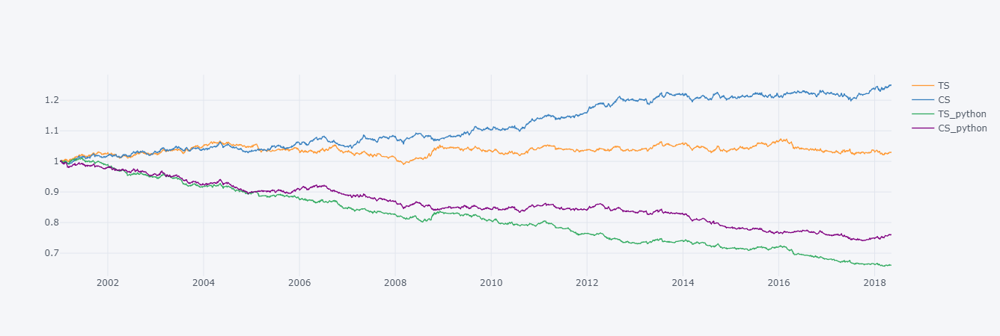

In [20]:
to_plot = (1.+ cca3_lag_comp_df).loc[start_date:].cumprod()
to_plot['TS_python'] = tester.strategy.TS_result
to_plot['CS_python'] = tester.strategy.CS_result
to_plot.iplot()

# 5. CVA3

In [21]:
cva3 = CVA3(strategy_name="CVA3", asset_type="COMMODITY")
cva3.load_index_and_return(from_db=False, save_file=False)
cva3.load_strategy_data1(table='bloom', origin='fx')
cva3.load_strategy_data2(table='past', origin='fut1price-com')
cva3.set_rebalance_period(ts_freq='month', cs_freq='month')  # rebalance_day: monday = 0, sunday = 6
cva3.calculate_signal(CS=0.35, nopos=0.4, minobs=60, minobs1=12, SMA=1, LMA=12, Lwindow=54)
cva3.set_portfolio_parameter(cs_strategy_type='vol', min_vol=0.15)
cva3.make_portfolio()

2020-01-02 10:33:40,386 - CVA3 - INFO - [STEP 0] START LOGGING CVA3
2020-01-02 10:33:40,388 - CVA3 - INFO - [STEP 1] LOAD DATA
2020-01-02 10:33:40,388 - CVA3 - INFO - [STEP 1 - 1] LOAD DATA FROM FILE
2020-01-02 10:33:55,674 - CVA3 - INFO - [STEP 2] SET REBALANCE PERIOD
2020-01-02 10:33:55,675 - CVA3 - INFO - [STEP 3] CACULATE SIGNAL
C:\Users\jungyoon.choi\Desktop\jungyoon\project\risk_premia\python\strategy\CVA3.py:126: FutureWarning:


Passing list-likes to .loc or [] with any missing label will raise
KeyError in the future, you can use .reindex() as an alternative.

See the documentation here:
https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#deprecate-loc-reindex-listlike

C:\Users\jungyoon.choi\Desktop\jungyoon\project\risk_premia\python\strategy\CVA3.py:127: FutureWarning:


Passing list-likes to .loc or [] with any missing label will raise
KeyError in the future, you can use .reindex() as an alternative.

See the documentation here:
https://pandas.pydata.org/p

In [22]:
start_date = '2001-01-01'
end_date = '2018-05-09'

# get r results
cva3_comp_df = pd.read_csv('./past/cva3.csv', header=0, index_col=0, parse_dates=True)
cva3_lag_comp_df = pd.read_csv('./past/cva3_lag.csv', header=0, index_col=0, parse_dates=True)

In [23]:
tester = Tester(cva3)
tester.set_period(start=start_date, end=end_date)
tester.run(save_file=False)

2020-01-02 10:35:25,937 - CVA3 - INFO - [STEP 6] START BACKTEST
2020-01-02 10:35:25,937 - CVA3 - INFO - [STEP 6 - 1] BACKTEST CVA3 TIME SERIES
2020-01-02 10:35:27,462 - CVA3 - INFO - [STEP 6 - 2] BACKTEST CVA3 CROSS SECTIONAL


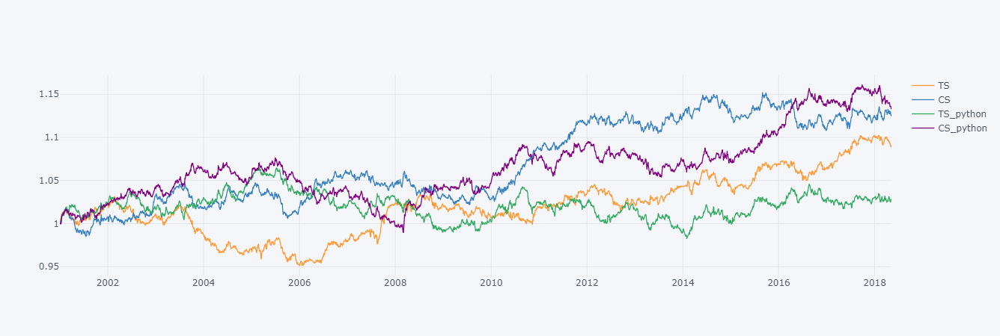

In [24]:
to_plot = (1.+ cva_lag_comp_df).loc[start_date:].cumprod()
to_plot['TS_python'] = tester.strategy.TS_result
to_plot['CS_python'] = tester.strategy.CS_result
to_plot.iplot()

# 6. CVA2

In [25]:
cva2 = CVA2(strategy_name="CVA2", asset_type="COMMODITY")
cva2.load_index_and_return(from_db=False, save_file=False)
cva2.load_strategy_data(table='bloom', origin='commo pos')
cva2.set_rebalance_period(ts_freq='week', cs_freq='week')
cva2.calculate_signal(CS=0.35, nopos=0.4, minobs1=12)
cva2.set_portfolio_parameter(cs_strategy_type='vol')
cva2.make_portfolio()

2020-01-02 10:35:30,205 - CVA2 - INFO - [STEP 0] START LOGGING CVA2
2020-01-02 10:35:30,205 - CVA2 - INFO - [STEP 1] LOAD DATA
2020-01-02 10:35:30,206 - CVA2 - INFO - [STEP 1 - 1] LOAD DATA FROM FILE
2020-01-02 10:35:36,122 - CVA2 - INFO - [STEP 2] SET REBALANCE PERIOD
2020-01-02 10:35:36,122 - CVA2 - INFO - [STEP 3] CACULATE SIGNAL
C:\Users\jungyoon.choi\Desktop\jungyoon\project\risk_premia\python\strategy\CVA2.py:126: FutureWarning:


Passing list-likes to .loc or [] with any missing label will raise
KeyError in the future, you can use .reindex() as an alternative.

See the documentation here:
https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#deprecate-loc-reindex-listlike

C:\Users\jungyoon.choi\Desktop\jungyoon\project\risk_premia\python\strategy\CVA2.py:127: FutureWarning:


Passing list-likes to .loc or [] with any missing label will raise
KeyError in the future, you can use .reindex() as an alternative.

See the documentation here:
https://pandas.pydata.org/p

In [26]:
start_date = '2001-01-01'
end_date = '2018-05-09'

# get r results
cva2_comp_df = pd.read_csv('./past/cva2.csv', header=0, index_col=0, parse_dates=True)
cva2_lag_comp_df = pd.read_csv('./past/cva2_lag.csv', header=0, index_col=0, parse_dates=True)

In [27]:
tester = Tester(cva2)
tester.set_period(start=start_date, end=end_date)
tester.run(save_file=False)

2020-01-02 10:36:55,116 - CVA2 - INFO - [STEP 6] START BACKTEST
2020-01-02 10:36:55,117 - CVA2 - INFO - [STEP 6 - 1] BACKTEST CVA2 TIME SERIES
2020-01-02 10:36:56,530 - CVA2 - INFO - [STEP 6 - 2] BACKTEST CVA2 CROSS SECTIONAL


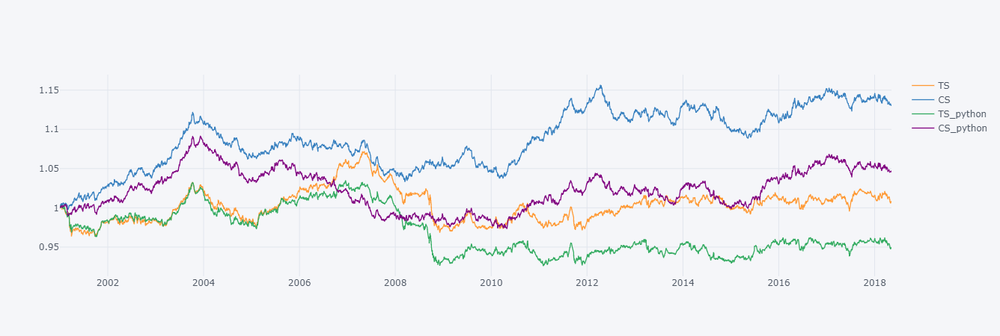

In [28]:
to_plot = (1.+ cva2_lag_comp_df).loc[start_date:].cumprod()
to_plot['TS_python'] = tester.strategy.TS_result
to_plot['CS_python'] = tester.strategy.CS_result
to_plot.iplot()

# 7. CSS

In [29]:
css = CSS(strategy_name="CSS", asset_type="COMMODITY")
css.load_index_and_return(from_db=False, save_file=False)
css.load_strategy_data1(table='bloom', origin1='fx', origin2='carry-com', origin3='carry-com2')
css.load_strategy_data2(table='past', origin='seasonal')
css.set_rebalance_period(ts_freq='month', cs_freq='month', rebalance_weekday=1)  # rebalance_day: monday = 0, sunday = 6
css.calculate_signal(CS=0.35)
css.set_portfolio_parameter(cs_strategy_type='vol')
css.make_portfolio()

2020-01-02 10:36:59,503 - CSS - INFO - [STEP 0] START LOGGING CSS
2020-01-02 10:36:59,504 - CSS - INFO - [STEP 1] LOAD DATA
2020-01-02 10:36:59,504 - CSS - INFO - [STEP 1 - 1] LOAD DATA FROM FILE
2020-01-02 10:37:36,283 - CSS - INFO - [STEP 2] SET REBALANCE PERIOD
2020-01-02 10:37:36,284 - CSS - INFO - [STEP 3] CACULATE SIGNAL
C:\Users\jungyoon.choi\Desktop\jungyoon\project\risk_premia\python\strategy\CSS.py:101: FutureWarning:


Passing list-likes to .loc or [] with any missing label will raise
KeyError in the future, you can use .reindex() as an alternative.

See the documentation here:
https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#deprecate-loc-reindex-listlike

C:\Users\jungyoon.choi\Desktop\jungyoon\project\risk_premia\python\strategy\CSS.py:67: FutureWarning:


Passing list-likes to .loc or [] with any missing label will raise
KeyError in the future, you can use .reindex() as an alternative.

See the documentation here:
https://pandas.pydata.org/pandas-doc

In [30]:
start_date = '2001-01-01'
end_date = '2018-05-09'

# get r results
css_comp_df = pd.read_csv('./past/css.csv', header=0, index_col=0, parse_dates=True)
css_lag_comp_df = pd.read_csv('./past/css_lag.csv', header=0, index_col=0, parse_dates=True)

In [31]:
tester = Tester(css)
tester.set_period(start=start_date, end=end_date)
tester.run(save_file=False)

2020-01-02 10:38:55,234 - CSS - INFO - [STEP 6] START BACKTEST
2020-01-02 10:38:55,234 - CSS - INFO - [STEP 6 - 1] BACKTEST CSS TIME SERIES
2020-01-02 10:38:56,563 - CSS - INFO - [STEP 6 - 2] BACKTEST CSS CROSS SECTIONAL


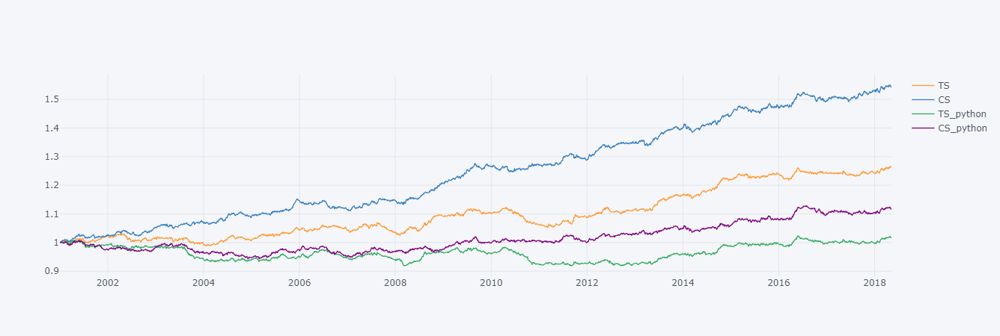

In [32]:
to_plot = (1.+ css_lag_comp_df).loc[start_date:].cumprod()
to_plot['TS_python'] = tester.strategy.TS_result
to_plot['CS_python'] = tester.strategy.CS_result
to_plot.iplot()